# Traffic lane marking detection
In this assignment, you will use image processing techniques and the Hough Transform to identify traffic lane markings in a series of test images. \
There are 5 sets of images in total. Start with set 1, and then review the other sets (some are more difficult than others)


## Submission Details
Assignment deadline: Midnight, Sunday 10 November \
Jupyter Notebook containing submission to be submitted via Canvas \
Total grade: 20% of final module mark \
Submit the assignment as a notebook (i.e. .iynb file) \
Use the following format for your filename: firstname_lastname_assignment3.ipynb

# Submission details
### Name: Patrick Noonan
### ID: 20355426
### Class code: MECE

In [2]:
# install required libraries
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import os
import random
%matplotlib inline


## Load test images


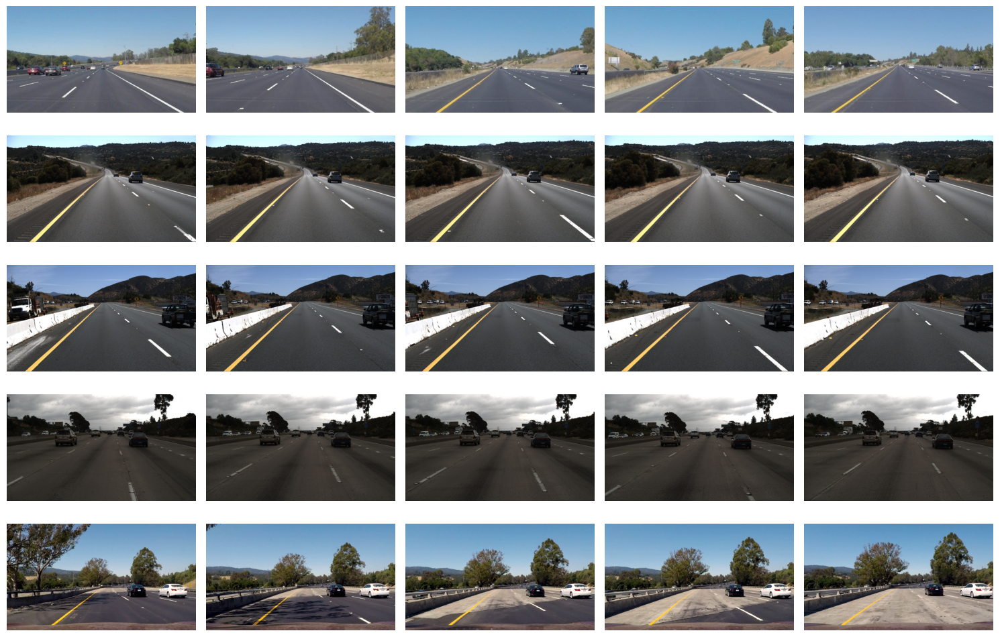

In [3]:
import os
import cv2
import matplotlib.pyplot as plt

# Define the base path to your images folder
base_input_path = 'images/'
set_names = ['set_1', 'set_2', 'set_3', 'set_4', 'set_5']
images_by_set = {}

# Loop through each set and read images
for set_name in set_names:
    input_path = os.path.join(base_input_path, set_name)
    filenames = [os.path.join(input_path, filename) for filename in os.listdir(input_path)]
    # Read each image in the current set and store it in a list
    images_by_set[set_name] = [cv2.imread(filename) for filename in filenames]

# Set up the figure for displaying images
num_sets = len(set_names)
num_images_per_set = max(len(images) for images in images_by_set.values())  # Find max images in any set

fig, axes = plt.subplots(num_sets, num_images_per_set, figsize=(15, 10))  # Adjust figure size as needed

for row, set_name in enumerate(set_names):
    images = images_by_set[set_name]
    for col in range(num_images_per_set):
        ax = axes[row, col] if num_sets > 1 else axes[col]  # Handle single row case

        if col < len(images):
            ax.imshow(cv2.cvtColor(images[col], cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for display
            ax.axis('off')
        else:
            ax.axis('off') 

plt.tight_layout()
plt.show()

## Convert the images to greyscale

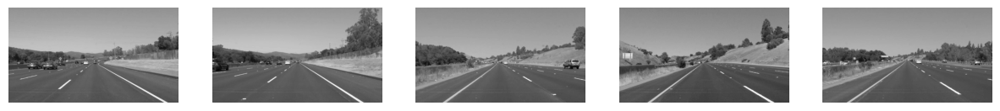

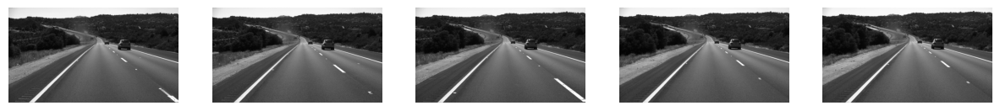

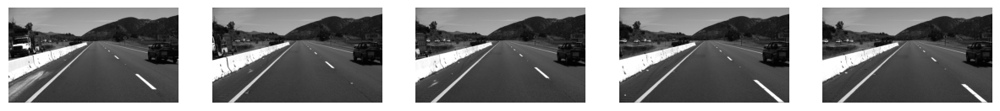

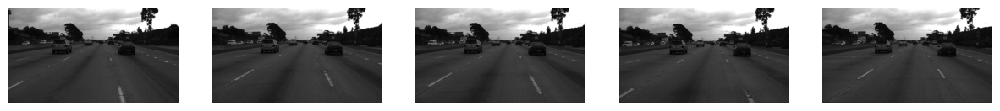

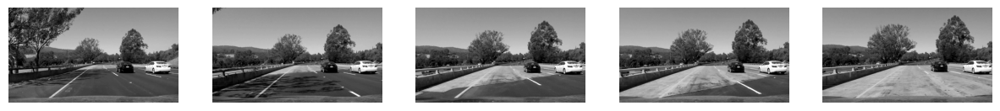

In [4]:
# take all the images in the list and create a list of greyscale images

images_by_set_grey = {}

# Convert each image in each set to grayscale
for set_name, images in images_by_set.items():
    grey_images = [cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) for image in images]
    images_by_set_grey[set_name] = grey_images

# Display grayscale images for each set
for set_name, grey_images in images_by_set_grey.items():
    fig, axs = plt.subplots(1, len(grey_images), figsize=(15, 5))
    for i, grey in enumerate(grey_images):
        axs[i].imshow(grey, cmap='gray')
        axs[i].axis('off')
    plt.show()

# plot the image to confirm 
    

## Apply Gaussian blur
Gaussian blur reduces noise and weak edges. In principle, only sharper, more defined edges (i.e. road markings) will remain\

The image should look something like this:
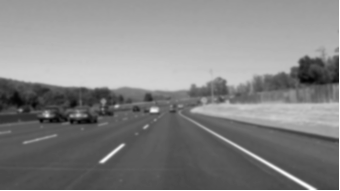

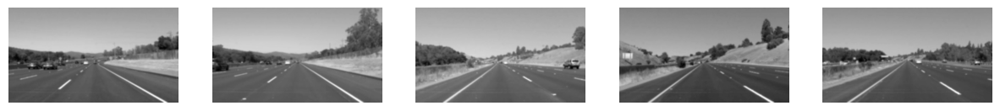

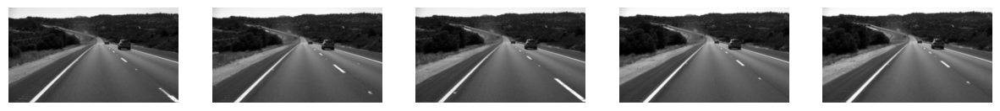

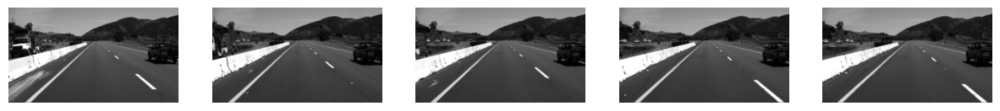

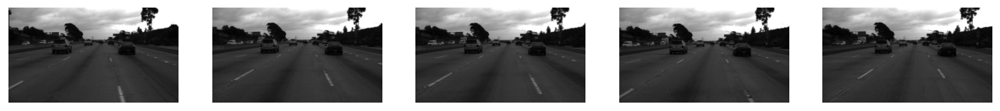

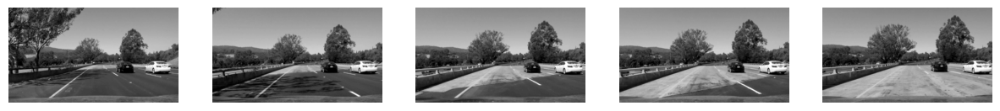

In [5]:
# define the blur kernel size. Hint: a kernel size of 15 works fairly well
kernel_size = 5

blur_images_set = {}
# blur all of the images with opencv's gaussian blur function and populate the blur_images list with the result
for set_name, images in images_by_set_grey.items():
    
    if set_name == 'set_4':
        blur_images = [cv2.GaussianBlur(image, (15, 5), 1.5) for image in images]
    elif set_name == 'set_5':
        blur_images = [cv2.GaussianBlur(image, (5, 15), 1.5) for image in images]
    else:
        blur_images = [cv2.GaussianBlur(image, (15, 15), 0) for image in images]

    blur_images_set[set_name] = blur_images


for set_name, grey_images in blur_images_set.items():
    fig, axs = plt.subplots(1, len(grey_images), figsize=(15, 5))
    for i, grey in enumerate(grey_images):
        axs[i].imshow(grey, cmap='gray')
        axs[i].axis('off')
    plt.show()

## Detect edges
The next step is to detect edges in the image. In general, the Canny edge detector works well for this operation\

The result should look something like this:
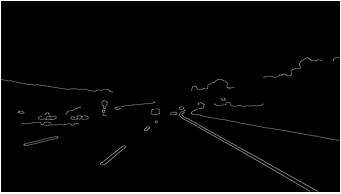

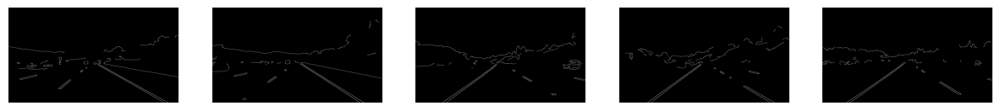

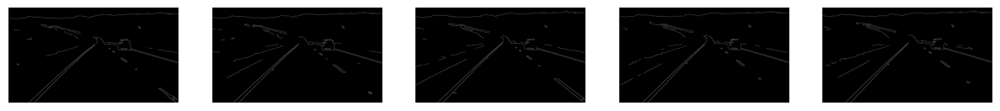

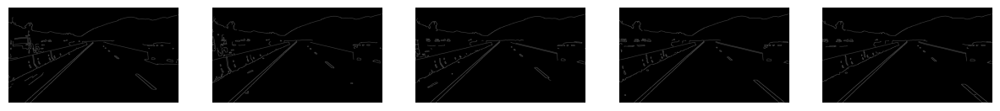

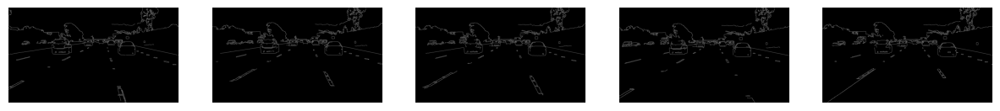

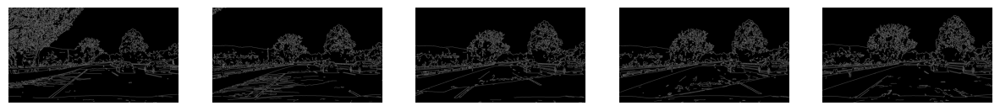

In [6]:
# define edge thresholds. Note: these thresholds may need to be adjusted for different scenarios.
# hint: 20 and 100 work well for the first set (but not necessarily all...)
# apply edge detection to the blur_images list of images
canny_images_set = {}
for set_name, images in blur_images_set.items():
    if set_name == 'set_4':
        canny = [cv2.Canny(image, 30, 85) for image in images]
    elif set_name == 'set_5':
        canny = [cv2.Canny(image, 30, 90) for image in images]
    else:
        canny = [cv2.Canny(image, 20, 100) for image in images]

    canny_images_set[set_name] = canny
    
#display edge images
for set_name, images in canny_images_set.items():
    fig, axs = plt.subplots(1, len(images), figsize=(15, 5))
    for i, canny in enumerate(images):
        axs[i].imshow(canny, cmap='gray')
        axs[i].axis('off')
    plt.show()


## Define region of interest
We only want to look for edges in the road in front of the camera, and we want to ignore edges in the sky, background etc. To do this, we will define a region of interest. All edges outside the region of interest are ignored

The result should look something like this example, where most of the background has been ignored:
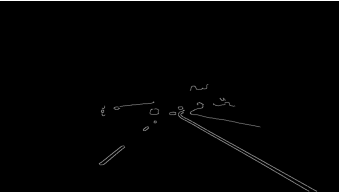


In [7]:
# Note: use this code as is, there is no need to change

# define a region of interest mask
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon defined by "vertices". 
    The rest of the image is set to black.
    """
    #define a blank mask
    mask = np.zeros_like(img)   
    
    #define a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

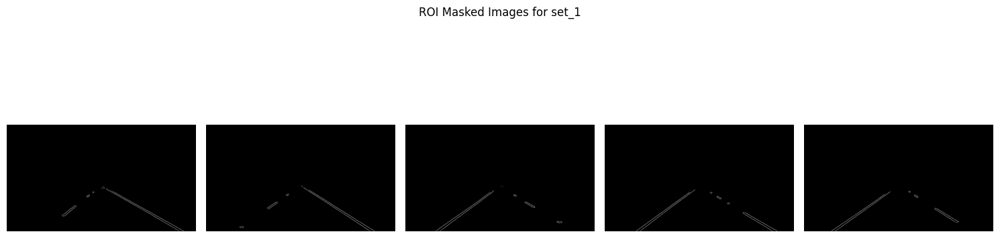

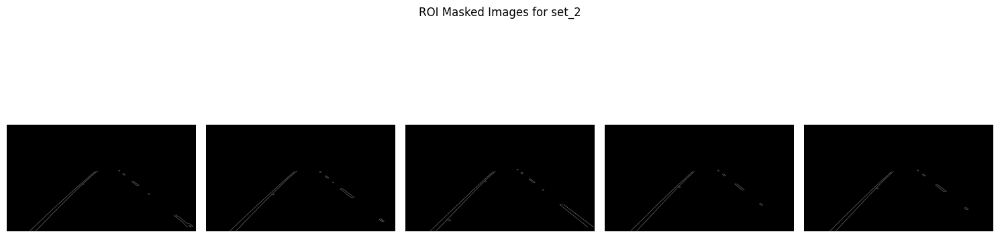

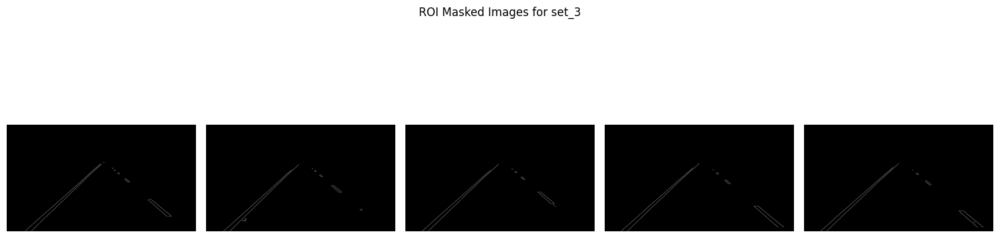

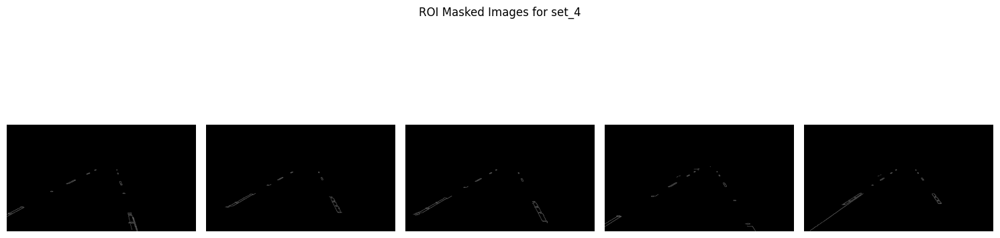

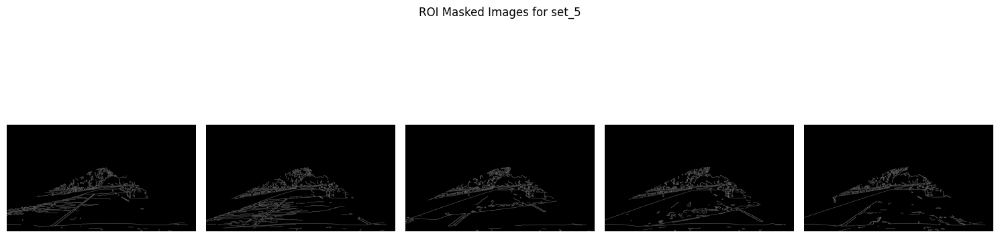

In [8]:
image_shapes = {}

for set_name, images in images_by_set.items():
        image_shapes[set_name] = images[0].shape 

# define region of interest. The region of interest should include the road area and ignore the background
# the coordinates will need to be changed, depending on the image set used, as the field of view will be different
# define the region as a numpy array, of type np.int32
def get_region(set_name, xsize, ysize):
    if set_name == 'set_1':
        return np.array([[(500, 310), (xsize - 480, 310), (xsize, ysize), (0, ysize)]], dtype=np.int32)
    elif set_name in 'set_2':
        return np.array([[(550, 325), (xsize - 500, 280), (xsize, ysize - 30), (0, ysize)]], dtype=np.int32)
    elif set_name == 'set_3':
        return np.array([[(680, 230), (xsize - 650, 230), (xsize, ysize - 30), (20, ysize)]], dtype=np.int32)
    elif set_name == 'set_4':
        return np.array([[(600, 300), (xsize - 550, 280), (xsize, ysize), (-300, ysize)]], dtype=np.int32)
    else:
         return np.array([[(600, 300), (xsize - 550, 280), (xsize, ysize), (-300, ysize)]], dtype=np.int32)
masked_images_by_set = {}

for set_name, images in canny_images_set.items():
    # Get xsize and ysize from the shape of the first image in the set
    if set_name in image_shapes:
        ysize, xsize = image_shapes[set_name][:2]
        region = get_region(set_name, xsize, ysize)  # Generate region based on current dimensions
        
        # Apply the region mask to each image in the set
        masked_images = [region_of_interest(img, [region]) for img in images]
        masked_images_by_set[set_name] = masked_images  

for set_name, masked_images in masked_images_by_set.items():
    fig, axs = plt.subplots(1, len(masked_images), figsize=(15, 5))
    fig.suptitle(f"ROI Masked Images for {set_name}")
    for i, masked_image in enumerate(masked_images):
        axs[i].imshow(masked_image, cmap='gray')
        axs[i].axis('off')
    plt.tight_layout()
    plt.show()

## Apply Hough Transform
We will use the Hough Transform to detect lines in the image

You should expect to see something that looks like this:
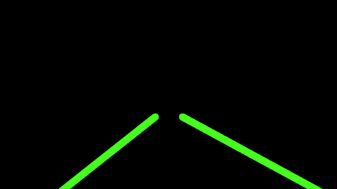

In [9]:
# Define helper function to draw the lines detected by the Hough Transform
# These functions can be used as is, however, modify/update the code as you may require. Some examples could include adaptive line length, curved lines, etc.


# helper function - fit a line to the Hough tranform coordinates, and plot on the image
def drawLine(img, x, y, color=[0, 255, 0], thickness=20):
    if len(x) == 0: 
        return
    
    lineParameters = np.polyfit(x, y, 1) 
    
    m = lineParameters[0]
    b = lineParameters[1]
    
    maxY = img.shape[0]
    maxX = img.shape[1]
    y1 = maxY
    x1 = int((y1 - b)/m)
    y2 = int((maxY/2)) + 60  # note: hardcoded, sets the length of the line to half the image height + 60 pixels
    x2 = int((y2 - b)/m)
    cv2.line(img, (x1, y1), (x2, y2), color, thickness)


# Helper function - split the detected lines into left and right lines
def draw_lines(img, lines, color=[0, 255, 0], thickness=20):

    leftPointsX = []
    leftPointsY = []
    rightPointsX = []
    rightPointsY = []

    for line in lines:
        for x1,y1,x2,y2 in line:
            m = (y1 - y2)/(x1 - x2)
            
                        
            if m < 0:
                leftPointsX.append(x1)
                leftPointsY.append(y1)
                leftPointsX.append(x2)
                leftPointsY.append(y2)
            else:
                rightPointsX.append(x1)
                rightPointsY.append(y1)
                rightPointsX.append(x2)
                rightPointsY.append(y2)

    drawLine(img, leftPointsX, leftPointsY, color, thickness)
        
    drawLine(img, rightPointsX, rightPointsY, color, thickness)



In [10]:
# define a function - calculate Hough lines based on the Canny images, and draw them on the output image

# use the opencv cv2.HoughLinesP to calculate the Hough lines in the image (i.e. to detect the lanes)

def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap):
    lines = cv2.HoughLinesP(img, rho, theta, threshold, min_line_len, max_line_gap) # insert your code here
    line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    draw_lines(line_img, lines)
    return line_img

C:\Users\Patrick\AppData\Local\Temp\ipykernel_22704\2059010065.py:34: RuntimeWarning: divide by zero encountered in scalar divide
  m = (y1 - y2)/(x1 - x2)


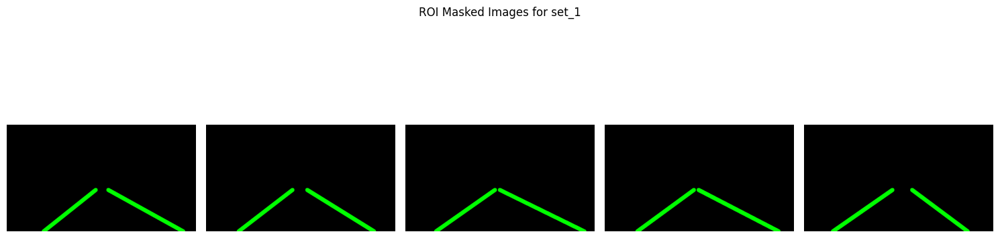

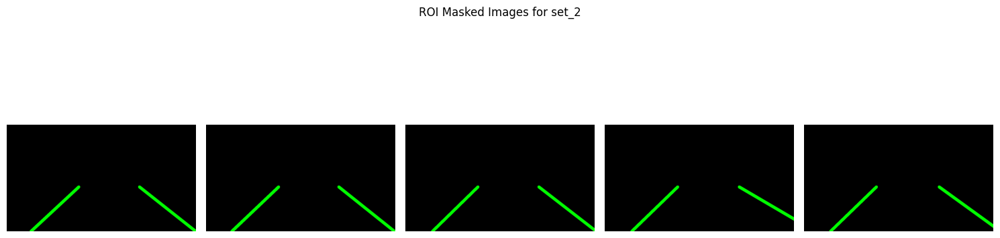

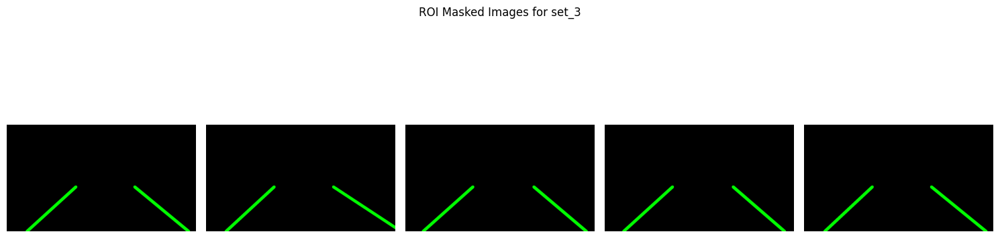

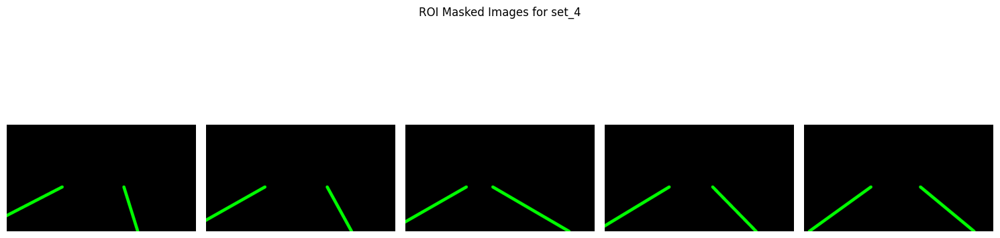

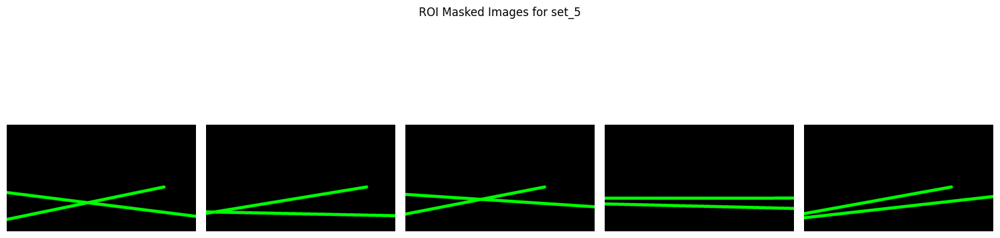

In [11]:
# define the parameters for the Hough line detector. The default values work reasonably well
hough_images_set = {}
rho = 1.42 # distance resolution in pixels of the Hough grid
theta = np.pi/180 # angular resolution in radians of the Hough grid
threshold = 10   # minimum number of votes (intersections in Hough grid cell)
min_line_length = 20 # minimum number of pixels making up a line
max_line_gap = 12   # maximum gap in pixels between connectable line segments

for set_name, images in masked_images_by_set.items():
    hough_image = [hough_lines(img, rho, theta, threshold, min_line_length, max_line_gap) for img in images]
    hough_images_set[set_name] = hough_image

for set_name, hough_images in hough_images_set.items():
    fig, axs = plt.subplots(1, len(hough_images), figsize=(15, 5))
    fig.suptitle(f"ROI Masked Images for {set_name}")
    for i, hough_image in enumerate(hough_images):
        axs[i].imshow(hough_image, cmap='gray')
        axs[i].axis('off')
    plt.tight_layout()
    plt.show()

## Plot the Hough Lines on the original images
Now that we have detected the lines, we will overlay them on the original images.

Bringing it all together:

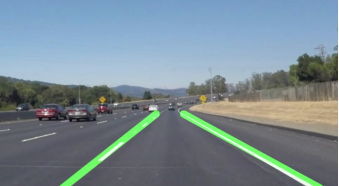

Note: In your *submitted* Jupyter Notebook, in this section you should include graphs of all images in the 5 test sets, with the "overlay" of the detected lane markings on the original image (up to 25 images). 
For the intermediate stages of processing, it is sufficient to include plots of two test images, one "easy" and one "hard" in your submitted notebook. However, during development of your code, you will of course need to test all 25 test images to make sure your algorithm is working correctly.  

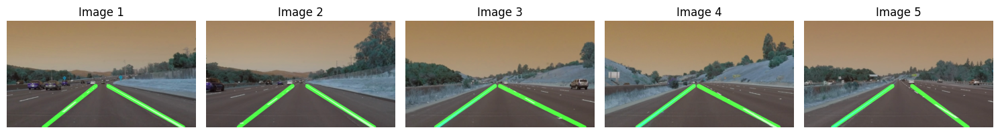

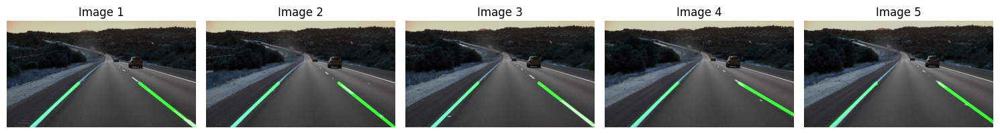

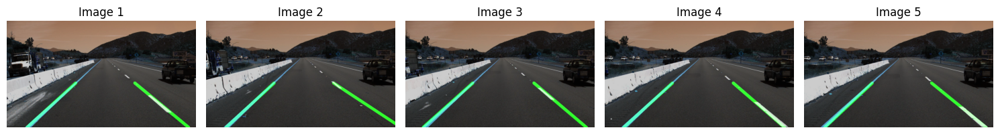

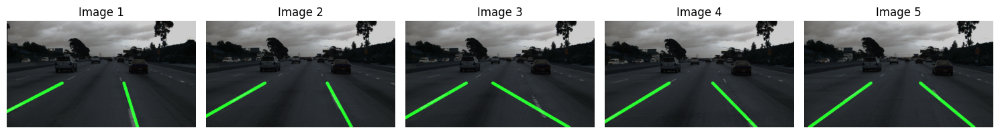

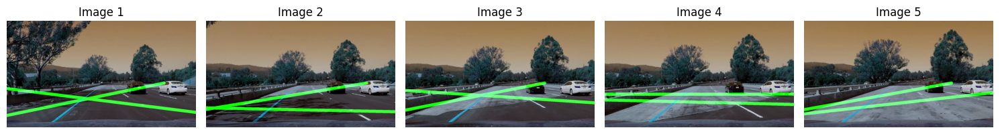

In [12]:
# define variables for merging
α=0.8
β=1.0 
λ=0.0

final_images_set = {}

for set_name, images in images_by_set.items():
    blended_images = []
    
    # Loop over each image in the set and blend with the corresponding Hough image
    for i in range(len(images)):
        original_image = images[i]
        hough_image = hough_images_set[set_name][i]  # Make sure this exists and is of the same size
        
        # Ensure the images are the same size
        if original_image.shape == hough_image.shape:
            blended_image = cv2.addWeighted(original_image, α, hough_image, β, λ)
            blended_images.append(blended_image)
    # Store the list of blended images for this set
    final_images_set[set_name] = blended_images

for set_name, blended_images in final_images_set.items():
    fig, axs = plt.subplots(1, len(blended_images), figsize=(15, 5))
    
    for i, blended_image in enumerate(blended_images):
        axs[i].imshow(blended_image, cmap='gray')
        axs[i].axis('off')
        axs[i].set_title(f"Image {i + 1}")
    
    plt.tight_layout()
    plt.show()

## Summary of findings, and other remarks

Comment on the performance of the line detector: 
- In what scenarios (i.e. test sets) does it work well?
- In what scenarios (i.e. test sets) does it not work? 
- Comment on why this implementation does not work in some scenarios
- Set 5 images are more challenging due to road surface and contrast changes. You may need to make your aproach more "sophisticated" to account for this.
- Vary the threshold parameters of the Canny edge detector, and comment on the impact on the lane detection performance
- Vary the parameters used by the cv2.HoughLinesP function (rho, theta, threshold etc), and comment on the impact on the lane detection performance
- Suggest methods to improve the performance of this lane detector. Specifically, consider how you would make the detector more robust against changes in contrast, lighting etc

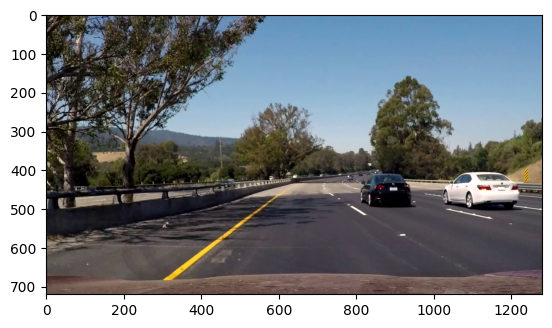

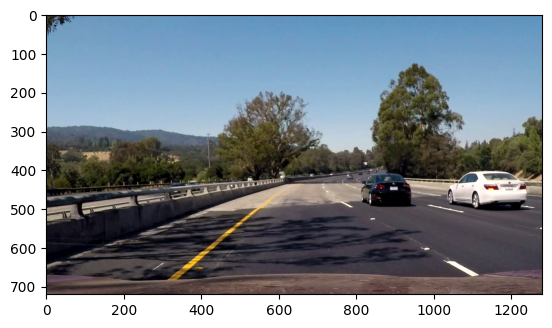

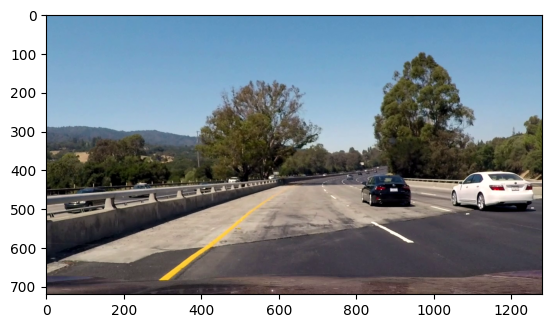

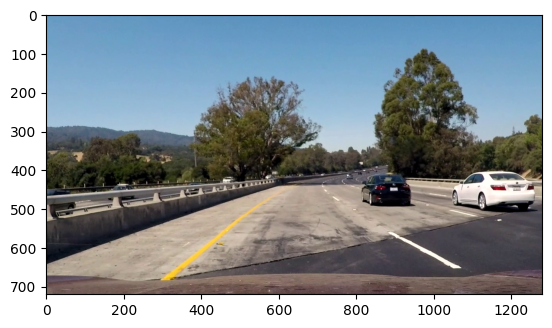

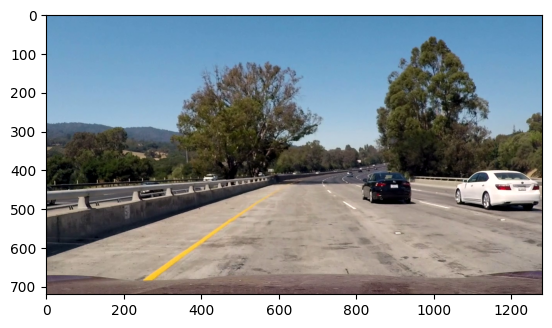

In [66]:
input_path = 'images/set_5/'
filenames = [input_path + filename for filename in os.listdir(input_path)]
raw_images = [cv2.imread(filename) for filename in filenames]
count = len(raw_images)
for i in range(count):
    plt.imshow(cv2.cvtColor(raw_images[i], cv2.COLOR_BGR2RGB))
    plt.show()

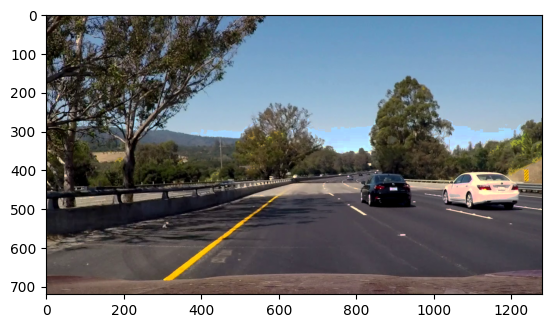

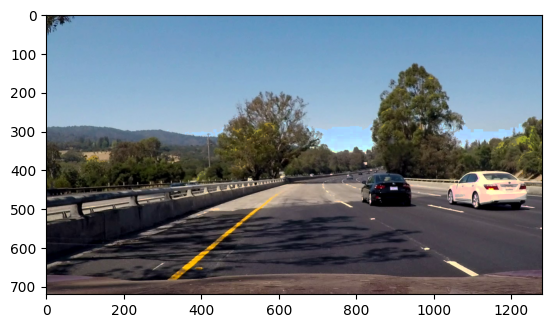

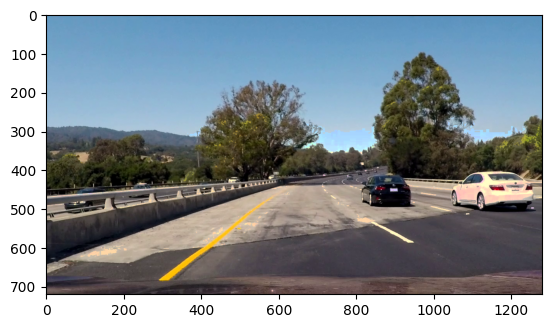

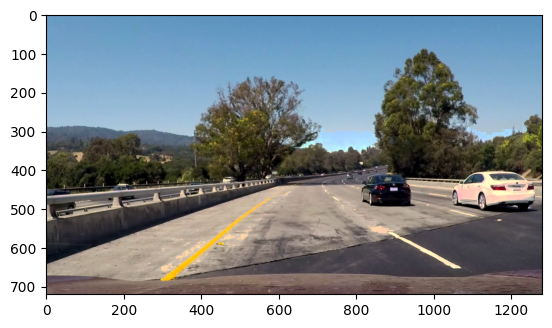

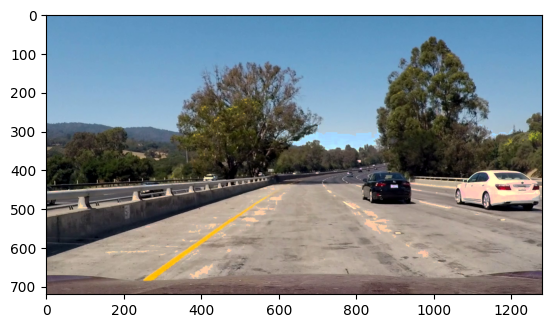

In [129]:
# Example pipeline
hsv_images = []
for image in raw_images:
    # Convert to HSV
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Define color ranges for yellow and white
    lower_yellow = np.array([20, 100, 100])
    upper_yellow = np.array([40, 255, 255])
    lower_white = np.array([0, 0, 200])
    upper_white = np.array([180, 40, 255])

    # Create masks
    yellow_mask = cv2.inRange(hsv_image, lower_yellow, upper_yellow)
    white_mask = cv2.inRange(hsv_image, lower_white, upper_white)

    # Enhance yellow and white regions
    hsv_image[:, :, 1] = cv2.add(hsv_image[:, :, 1], 50)  # Increase saturation
    hsv_image[:, :, 2] = cv2.add(hsv_image[:, :, 2], 50)  # Increase brightness
    hsv_image[:, :, 1] = np.clip(hsv_image[:, :, 1], 0, 255)
    hsv_image[:, :, 2] = np.clip(hsv_image[:, :, 2], 0, 255)

    # Convert back to BGR
    enhanced_image = cv2.cvtColor(hsv_image, cv2.COLOR_HSV2BGR)

    # Apply masks and combine with original image
    yellow_enhanced = cv2.bitwise_and(enhanced_image, enhanced_image, mask=yellow_mask)
    white_enhanced = cv2.bitwise_and(enhanced_image, enhanced_image, mask=white_mask)
    final_image = cv2.bitwise_and(image, image, mask=cv2.bitwise_not(yellow_mask + white_mask))
    final_image = cv2.add(final_image, yellow_enhanced)
    final_image = cv2.add(final_image, white_enhanced)

    hsv_images.append(final_image)

    plt.imshow(cv2.cvtColor(final_image, cv2.COLOR_BGR2RGB))
    plt.show()



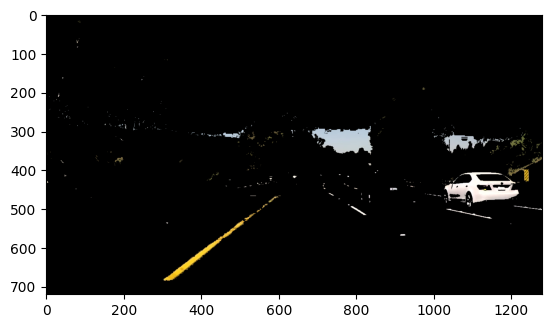

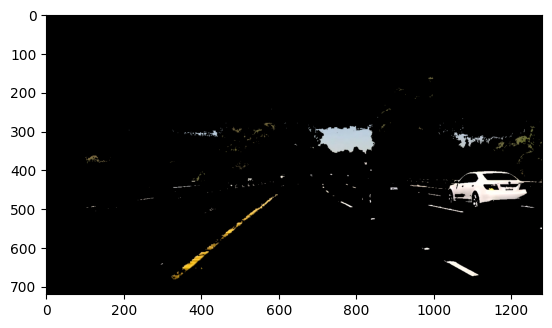

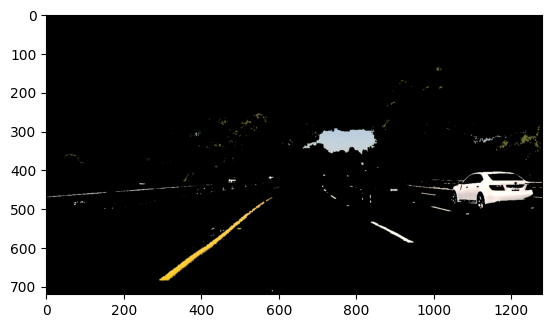

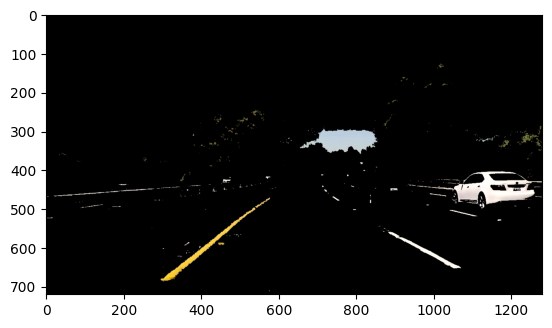

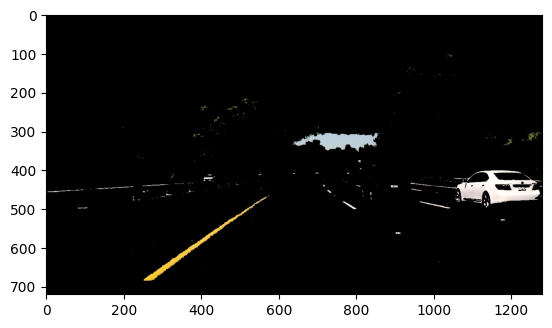

In [136]:
masked_images = []

for image in raw_images:
    # Convert the image to HSV color space
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # White color mask (in BGR space)
    lower_threshold_white = np.uint8([185, 185, 185])
    upper_threshold_white = np.uint8([255, 255, 255])
    white_mask = cv2.inRange(image, lower_threshold_white, upper_threshold_white)

    # Yellow color mask (in HSV space)
    lower_threshold_yellow = np.array([20, 100, 100])  # Lower bound of yellow in HSV
    upper_threshold_yellow = np.array([40, 255, 255])  # Upper bound of yellow in HSV

    # Create a mask for yellow areas
    yellow_mask = cv2.inRange(hsv_image, lower_threshold_yellow, upper_threshold_yellow)

    # Combine white and yellow masks
    mask = cv2.bitwise_or(white_mask, yellow_mask)

    # Apply the mask to the image
    masked_image = cv2.bitwise_and(image, image, mask=mask)
    masked_images.append(masked_image)
    # Display the masked image
    plt.imshow(cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB))
    plt.show()


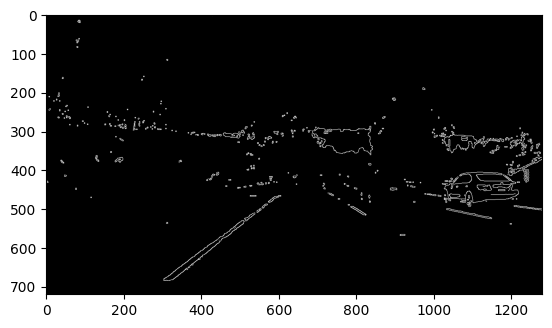

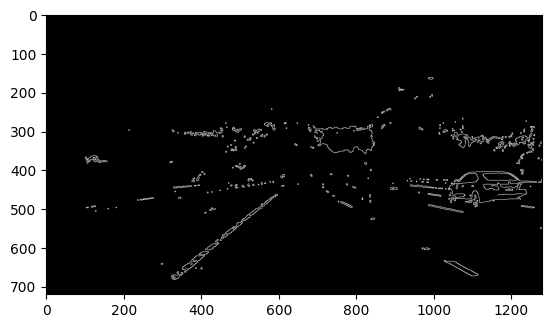

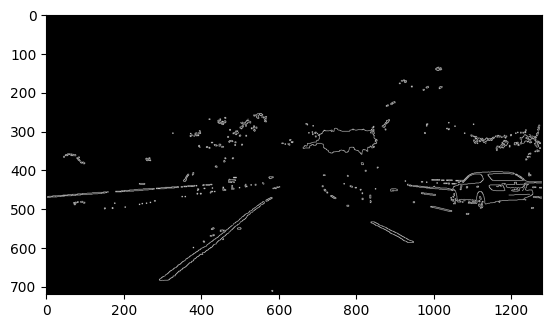

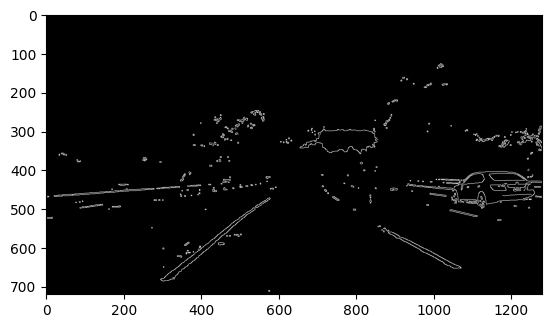

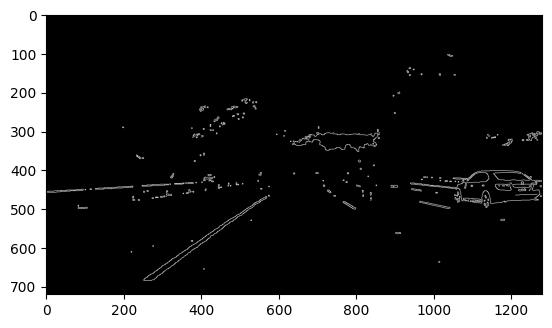

In [180]:
sobel_images = []

for image in masked_images:
    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Define a kernel size and apply Gaussian smoothing
    kernel_size = 5
    blur_gray = cv2.GaussianBlur(gray_image, (kernel_size, kernel_size), 0)

    # Define our parameters for Canny and apply
    low_threshold = 30
    high_threshold = 100
    edges = cv2.Canny(blur_gray, low_threshold, high_threshold)
    sobel_images.append(edges)
    # Display the image
    plt.imshow(edges, cmap='Greys_r')
    plt.show()

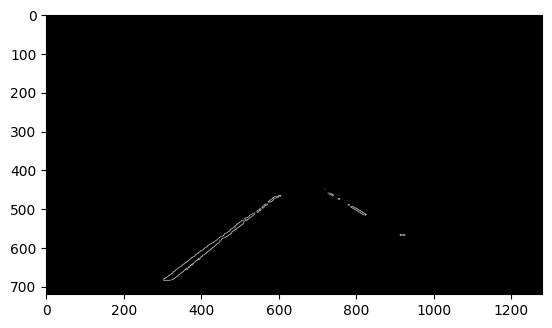

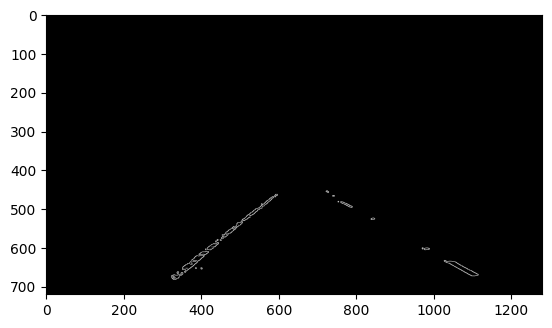

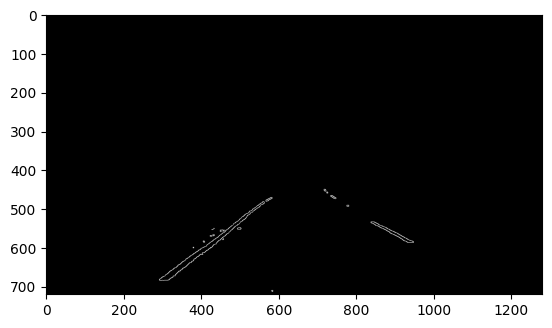

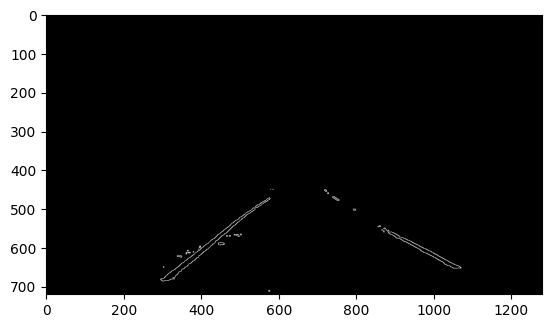

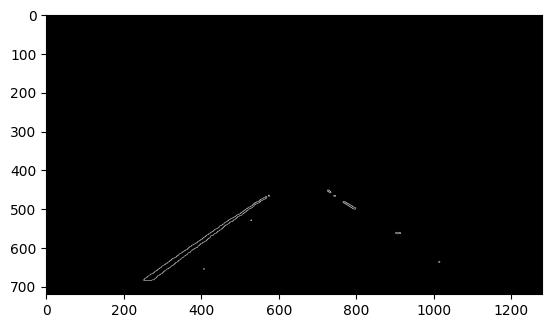

In [181]:
rois = []
for images in sobel_images:
    region = np.array([[(570, 450), (xsize - 520, 450), (1200, ysize), (200, ysize)]], dtype=np.int32)
    regionOfInterest = region_of_interest(images, region) 
    rois.append(regionOfInterest) 
    plt.imshow(regionOfInterest, cmap='Greys_r')
    plt.show()

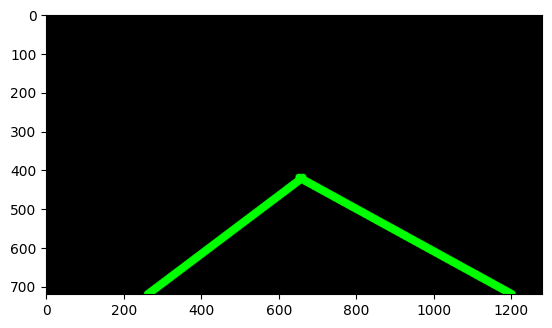

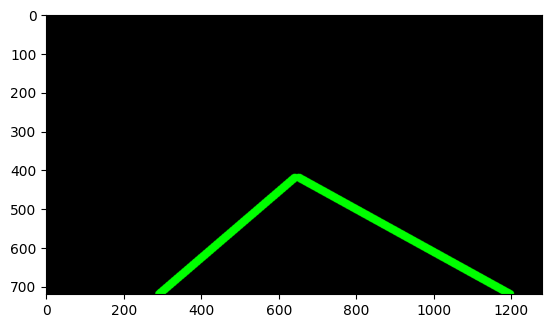

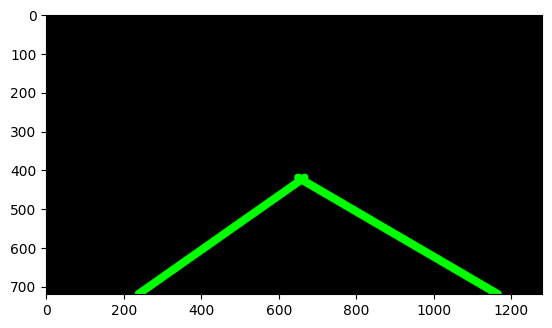

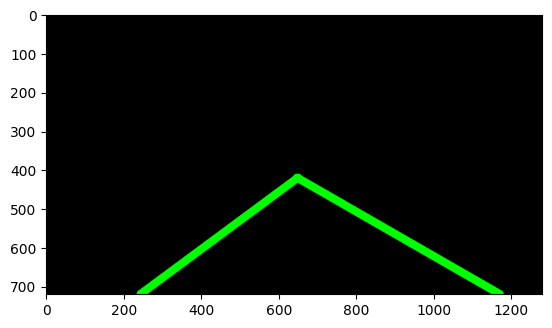

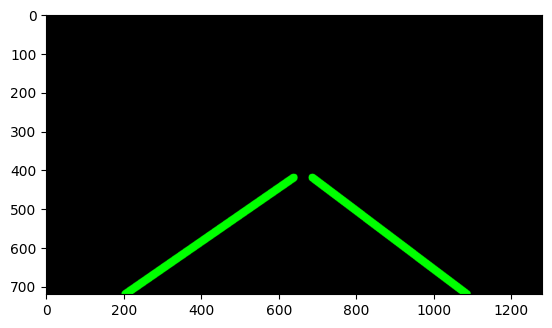

In [185]:
# define the parameters for the Hough line detector. The default values work reasonably well
hough_images = []
rho = 1.4 # distance resolution in pixels of the Hough grid
theta = np.pi/360 # angular resolution in radians of the Hough grid
threshold = 10   # minimum number of votes (intersections in Hough grid cell)
min_line_length = 15 # minimum number of pixels making up a line
max_line_gap = 10   # maximum gap in pixels between connectable line segments

for image in rois:
    hough_image = hough_lines(image, rho, theta, threshold, min_line_length, max_line_gap)
    hough_images.append(hough_image)
    plt.imshow(hough_image)
    plt.show()



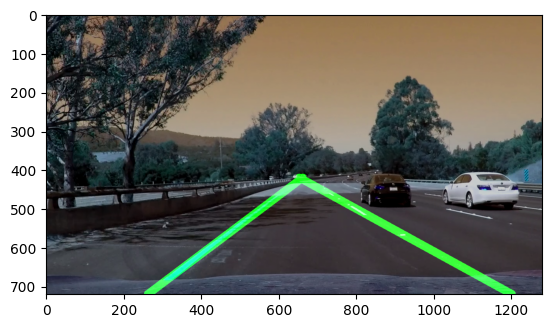

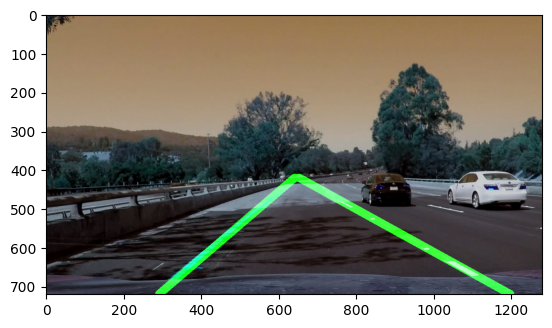

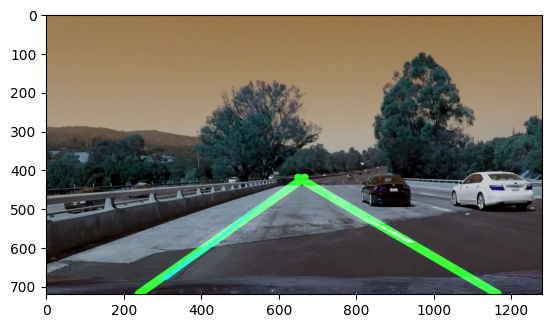

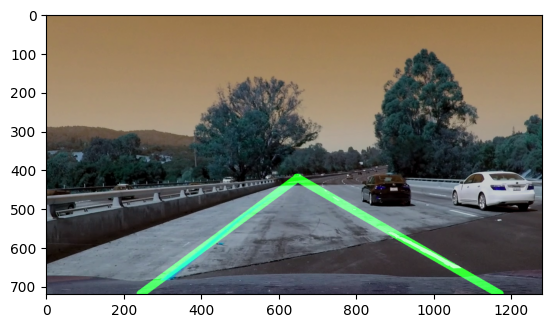

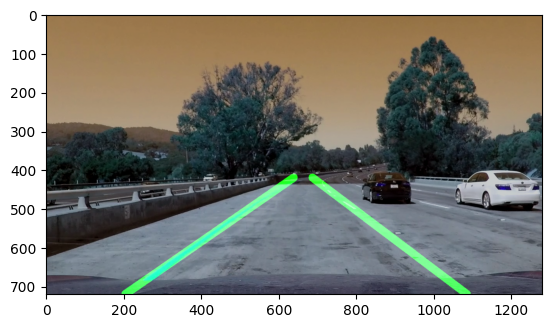

In [186]:
# define variables for merging
α=0.8
β=1.0 
λ=0.0

final_images = list()

# Assuming 'hough_images' is a list of Hough line images
for i in range(len(hough_images)):
    original_image = raw_images[i]
    hough_image = hough_images[i]  # Make sure this exists and is of the same size
    
    # Ensure the images are the same size
    if original_image.shape == hough_image.shape:
        blended_image = cv2.addWeighted(original_image, α, hough_image, β, λ)
        blended_images.append(blended_image)
    
    final_images.append(blended_image)
    # Display the final result (one of the merged images, for example the first one)
    plt.imshow( blended_image)
    plt.show()

       
    